In [1]:
import numpy as np
import pandas as pd
import re

from collections import Counter
import string

from konlpy.tag import Kkma
from konlpy.tag import Mecab
from konlpy.utils import pprint
from konlpy.tag import Twitter,Okt

import kss

import os

from tqdm import tqdm

from gensim.models import Word2Vec
import random

import time

import threading

from dateutil.parser import parse
from datetime import datetime

import plotly.express as px
import plotly.graph_objects as go
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot

In [2]:
okt = Okt()

# data

In [3]:
def data_list(path_):
    #path_ = r"C:\Users\Samsung\jupyter\Project_Deep_learning_2020\data\ear_phone"
    file_list = os.listdir(path_)
    file_list_xlsx_all = [path_+"\\"+f for f in file_list if f.endswith(".xlsx")]
    file_list_xlsx = [f for f in file_list if f.endswith(".xlsx")]
    return file_list_xlsx,file_list_xlsx_all

In [4]:
def load_data(path_):
    data_ = pd.read_excel(path_).drop(columns="Unnamed: 0")
    return data_

In [5]:
def load_all(ta,ra):
    da_1 = pd.DataFrame()
    for i in ta[1][ra[0]:ra[1]]:
        da_ = load_data(i)
        da_1 = pd.concat([da_1,da_]).reset_index(drop=True)
    return da_1

In [6]:
def parsing_date(df_):
    #df_ = coo_test
    parsing = [parse(d) for d in df_.loc[:,"date"]]
    df_["parse_date"] = parsing
    return df_

In [7]:
def prepro_date(df_):
    df_["year"] = [d.strftime("%Y") for d in df_["parse_date"]]
    df_["month"] = [d.strftime("%Y-%m") for d in df_["parse_date"]]
    df_["day"] = [d.strftime("%Y-%m-%d") for d in df_["parse_date"]]
    return df_

In [8]:
def remove_na(df_,target_):
    df_2 = df_[df_[target_] != "None"]
    return df_2.reset_index(drop=True)

In [9]:
def sen_split(df):
    sent_li = []
    for i in tqdm(range(len(df))):
        try:
            sen_ = kss.split_sentences(df["contents"][i])
            sent_li.append(sen_)
        except:
            sent_li.append([])
            print(df["contents"][i])
    df.loc[:,"sentences"] = sent_li
    return df

In [10]:
def pos_split(df):
    tag_li = []
    wo_li = []
    for i in tqdm(range(len(df))):
        sen = df["sentences"][i]
        tags_ = []
        wos_ = []
        for s in sen:
            tag_ = okt.pos(s,stem=True)
            word_ = [w[0] for w in tag_]
            tags_.append(tag_)
            wos_.append(word_)
        tag_li.append(tags_)
        wo_li.append(wos_)
    df.loc[:,"sen_tag"] = tag_li
    df.loc[:,"sen_word"] = wo_li
    return df

In [11]:
def all_pro(df):
    df2 = prepro_date(parsing_date(df))
    df3 = remove_na(df2,"contents")
    print("sentence_split")
    df4 = sen_split(df3)
    print("pos_tagging")
    df5 = pos_split(df4)
    return df5

# dic

In [12]:
def extract_pos(li_,target_):
    return [f[0] for f in li_ if f[1] in target_]

In [13]:
def dic_tag(dic_,target_):
    all_dic = {}
    all_dic_2 = {}
    for i in tqdm(range(len(dic_))):
        pos_all = []
        pos_noli = []
        neg_all = []
        neg_noli = []
        try:
            pos_ = dic_["긍정"][i].split(",")
            pos_tag = [ okt.pos(f,stem=True) for f in pos_]
            pos_ex = [extract_pos(f,target_) for f in pos_tag]

            pos_no = [extract_pos(f,"Noun") for f in pos_tag]
            [pos_noli.extend(w) for w in pos_no]

            [pos_all.extend(w) for w in pos_ex]

        except:
            pos_ex = []
            [pos_all.extend(w) for w in pos_ex]
        try:
            neg_ = dic_["부정"][i].split(",")
            neg_tag = [ okt.pos(f,stem=True) for f in neg_]

            neg_no = [extract_pos(f,"Noun") for f in neg_tag]
            [neg_noli.extend(w) for w in neg_no]

            neg_ex = [extract_pos(f,target_) for f in neg_tag]
            [neg_all.extend(w) for w in neg_ex]
        except:
            neg_ex = []
            [neg_all.extend(w) for w in neg_ex]

        noun_all = set(pos_noli).intersection(set(neg_noli))

        all_ = {"pos":pos_ex,"neg":neg_ex,"noun":noun_all}
        all_2 = {"pos":list(set(pos_all)),"neg":list(set(neg_all))}
        all_dic[dic_["Product Attribute 측면 속성"][i]] = all_
        all_dic_2[dic_["Product Attribute 측면 속성"][i]] = all_2
    return all_dic,all_dic_2

In [14]:
def dic_tag2(dic_,target_):
    all_dic = {}
    all_dic_2 = {}
    all_inter = []
    for i in tqdm(range(len(dic_))):
        pos_all = []
        pos_noli = []
        neg_all = []
        neg_noli = []
        try:
            pos_ = dic_["긍정"][i].split(",")
            pos_tag = [ okt.pos(f,stem=True) for f in pos_]
            pos_ex = [extract_pos(f,target_) for f in pos_tag]

            pos_no = [extract_pos(f,target_) for f in pos_tag]
            [pos_noli.extend(w) for w in pos_no]

            [pos_all.extend(w) for w in pos_ex]

        except:
            pos_ex = []
            [pos_all.extend(w) for w in pos_ex]
        try:
            neg_ = dic_["부정"][i].split(",")
            neg_tag = [ okt.pos(f,stem=True) for f in neg_]

            neg_no = [extract_pos(f,target_) for f in neg_tag]
            [neg_noli.extend(w) for w in neg_no]

            neg_ex = [extract_pos(f,target_) for f in neg_tag]
            [neg_all.extend(w) for w in neg_ex]
        except:
            neg_ex = []
            [neg_all.extend(w) for w in neg_ex]

        noun_all = set(pos_noli).intersection(set(neg_noli))
        all_inter.extend(pos_all)
        all_inter.extend(neg_all)
        all_ = {"pos":pos_ex,"neg":neg_ex,"noun":noun_all}
        all_2 = {"pos":list(set(pos_all)),"neg":list(set(neg_all))}
        all_dic[dic_["Product Attribute 측면 속성"][i]] = all_
        all_dic_2[dic_["Product Attribute 측면 속성"][i]] = all_2
    return all_dic,all_dic_2,all_inter

# evaluate 

In [15]:
okt = Okt()

In [16]:
text = "바람 세기 정말 좋네요. 전자파 차단 장치가 있네요"
text_pos = [w[0] for w in okt.pos(text,stem=True)]

def evalue_senti(dic_2,text_pos):
    key_most_pos = []
    key_most_neg = []
    for key in dic_2.keys():
        for candi in dic_2[key]["pos"]:
            if set(candi) <= set(text_pos).intersection(candi):
                if set(candi).difference(set(dic_2[key]["noun"])) != set():
                    key_most_pos.append(key)
            elif len(set(candi).intersection(text_pos)) >=2:
                if set(candi).difference(set(dic_2[key]["noun"])) != set():
                    key_most_pos.append(key)              
                    #print(key,candi,dic_2[key]["noun"])
        for candi in dic_2[key]["neg"]:
            if set(candi) <= set(text_pos).intersection(candi):
                if set(candi).difference(set(dic_2[key]["noun"])) != set():
                    key_most_neg.append(key)
            elif len(set(candi).intersection(text_pos)) >=2:
                if set(candi).difference(set(dic_2[key]["noun"])) != set():
                    key_most_pos.append(key) 
    try:
        count_po = Counter(key_most_pos).most_common(1)[0][0]
    except:
        count_po = ""
    try:
        count_ne = Counter(key_most_neg).most_common(1)[0][0]
    except:
        count_ne = ""
    
    return {"pos":count_po,"neg":count_ne}

In [17]:
def evalue_df(df,dic_2):
    pos_li = []
    neg_li = []

    for i in tqdm(range(len(df))):
        sens = df["sen_word"][i]
        pos = []
        neg = []
        for sen in sens:
            result = evalue_senti(dic_2,sen)
            if result["pos"] != "":
                pos.append(result["pos"])
            if result["neg"] != "":
                neg.append(result["neg"])
        pos_li.append(pos)
        neg_li.append(neg)
    df.loc[:,"pos"] = pos_li
    df.loc[:,"pos_len"] = [len(p) for p in pos_li]
    df.loc[:,"neg"] = neg_li
    df.loc[:,"neg_len"] = [len(p) for p in neg_li]
    
    return df

In [18]:
def total_eval(df):
    total = []
    for i in range(len(df)):
        #print(i)
        pos_ = df.loc[i,"pos_len"]
        neg_ = df.loc[i,"neg_len"]
        #print(type(pos_),type(neg_))
        if pos_+neg_ ==0:
            total.append("")
        elif pos_ > neg_:
            if pos_/neg_ <  2:
                total.append("neu")
            else:
                total.append("pos")
        elif neg_ >= pos_:
            total.append("neg")
            #if neg_/pos_ < 2:
                #total.append("neu")
            #else:
                #total.append("neg")
        elif pos_ == neg_:
            total.append("neu")
    df["evalue"] = total
    return df

In [19]:
def graph_form(coo_pos,dic_2):
    df_2 = evalue_df(coo_pos,dic_2)
    df_total = total_eval(df_2)
    ca = pd.DataFrame(df_total.groupby("month")["evalue"].agg("-".join))
    return ca

def graph_form2(ca):
    ca["split"] = ca["evalue"].map(lambda x: x.split("-"))
    ca["count"] = ca["split"].map(lambda x: Counter(x))
    pos = []
    neg = []
    neu = []
    for i in range(len(ca)):
        try:
            pos.append(ca["count"][i]["pos"])
        except:
            pos.append(0)
        try:
            neg.append(ca["count"][i]["neg"])
        except:
            neg.append(0)
        try:
            neu.append(ca["count"][i]["neu"])
        except:
            neu.append(0)
    ca["pos"] = pos
    ca["neg"] = neg
    ca["neu"] = neu
    ca["all"] = ca["pos"] + ca["neg"] + ca["neu"]
    return ca

def graph_form3(ca):
    month = []
    count = []
    eval_ = []
    for i in range(len(ca)):
        try:
            count.append(ca["count"][i]["pos"])
            eval_.append("pos")
            month.append(ca.index[i])
        except:
            pass
        try:
            count.append(ca["count"][i]["neg"])
            eval_.append("neg")
            month.append(ca.index[i])
        except:
            pass
        try:
            count.append(ca["count"][i]["neu"])
            eval_.append("neu")
            month.append(ca.index[i])
        except:
            pass
    ca_df = pd.DataFrame([month,count,eval_]).T.rename(columns={0:"month",1:"count",2:"eval"})
    ca = ca.drop(columns=["evalue","split","count"])
    return ca,ca_df

In [20]:
def make_concat(df_list):
    df_all = pd.DataFrame()
    for key,value in df_list.items():
        df_a = value
        df_a["Product"] = key
        df_all = pd.concat([df_all,df_a])
    return df_all.reset_index(drop=False)
    

In [21]:
# 날짜 통합을 위해서 만든것
def make_concat2(df_list):
    df_all = pd.DataFrame()
    all_index = []
    for key,value in df_list.items():
        df_a = value
        all_index.extend(list(df_a.index))

    month_df = pd.DataFrame(all_index).rename(columns={0:"month"})
    for key,value in df_list.items():
        df_a = value
        df_a = pd.merge(month_df,df_a,on="month",how="outer").fillna(0)
        df_a["Product"] = key
        df_all = pd.concat([df_all,df_a])
    return df_all.reset_index(drop=False)

# Dic

In [22]:
dic_ = pd.read_excel(r"C:\Users\Samsung\Desktop\Project\이희정 교수님\project\dic_data\드라이기_20201207.xlsx",sheet_name="data_")

In [23]:
#a_dic,a_dic_2,all_inter = dic_tag2(dic_,["Noun","Adjective","Verb","Adverb"])
a_dic,a_dic_2 = dic_tag(dic_,["Noun","Adjective","Verb","Adverb"])
a_dic

100%|██████████████████████████████████████████████████████████████████████████████████| 70/70 [00:02<00:00, 32.16it/s]


{'바람 세기': {'pos': [['바람', '쎄다'],
   ['드라이기', '바람', '세기', '만족하다'],
   ['바람', '세다', '좋다'],
   ['바람', '세기', '좋다'],
   ['바람', '세기', '맘에듭니'],
   ['바람', '세기', '강하다'],
   ['강하다', '바람', '젖다', '머리', '금방', '말', '좋다'],
   ['바람', '세다', '빨리', '말르다'],
   ['사용', '하다', '적당하다', '바라다', '이다'],
   ['바람', '세기', '충분하다'],
   ['바람', '세기', '단계', '별로', '있다'],
   ['바람', '쎄다', '좋다'],
   ['바람', '세기', '최고', '이다'],
   ['바람', '세다', '빨리', '건조', '되다', '만족하다'],
   ['바람', '쎄다', '물기', '금방', '마르다', '느낌'],
   ['바람', '세기', '흡족하다'],
   ['바람', '쎄다', '따라오다', '힘들껍니'],
   ['바람', '최상급'],
   ['강력하다', '바라다', '이다'],
   ['빠르다', '확실하다', '건조', '가능하다'],
   ['바람', '세기', '엄청나다'],
   ['빠르다', '건조', '만족하다'],
   ['출력', '그렇다', '바람', '완전', '쎄다'],
   ['파워', '풀', '바람', '좋다'],
   ['바람', '세기', '최고', '진짜', '속', '시원하다', '나오다'],
   ['바람', '세기', '장난', '아니다', '쩌렁'],
   ['바람', '세기', '더하다', '나위', '없다'],
   ['바람', '세기', '작살', '여'],
   ['역시', '가용', '바람', '세기', '다르다'],
   ['가정', '용', '확실하다', '쎄다', '미용실', '정도', '바람', '나오다'],
   ['바람', '세기', '남다름']],
  'neg': [

# Data

In [24]:
#blog_li = data_list(r"C:\Users\Samsung\jupyter\Project_LG_textmining\data\hair\blog")
coo_li = data_list(r"C:\Users\Samsung\jupyter\Project_LG_textmining\data\hair\shopping\coupang")
#auc_li = data_list(r"C:\Users\Samsung\jupyter\Project_LG_textmining\data\hair\shopping\auction")

In [25]:
coo_li

(['coupang_CKI_가정용_접이식_헤어_드라이어_1200W,_CKI-D200,_혼합_색상.xlsx',
  'coupang_CKI_가정용_헤어_드라이어_CKI-D303_1300_W,_화이트.xlsx',
  'coupang_CKI_접이식_헤어_드라이어_1200W,_CKI-D201.xlsx',
  'coupang_JMW_BLDC_항공모터_드라이기,_MG1800,_화이트.xlsx',
  'coupang_[쿠팡_직수입]_시프이컴_헤어드라이어_6290_1800W,_블랙.xlsx',
  'coupang_델루체_DC모터_헤어_드라이기_DLC-12000_1600W,_혼합색상.xlsx',
  'coupang_바비리스_전문가용_프로_스피드_헤어_드라이기_D105K_2000W,_단일_색상.xlsx',
  'coupang_비달사순_2000W_파워_블랙_앤_로즈_헤어_드라이기_VSD120K,_혼합_색상.xlsx',
  'coupang_비달사순_강력바람_프로_헤어드라이기_VSD565K_2000W,_혼합색상.xlsx',
  'coupang_비달사순_파워_블랙앤로즈_드라이어_VSD5129K_2000W,_로즈골드.xlsx',
  'coupang_비달사순_풍속_풍온_조절_헤어드라이기_헤어드라이어_VS5548KTycheLiz,_본상품선택,_상세_설명_참조.xlsx',
  'coupang_샤오미_아이오닉_헤어드라이어_CMJ01LX3_1800W,_단일색상.xlsx',
  'coupang_앱코_오엘라_가정용_헤어_드라이어_HD01_1200W,_민트.xlsx',
  'coupang_에스엠퓨처스_여행용_접이식_헤어_드라이기_SMF1601AH_1600W_+_원형_디퓨저,_단일색상.xlsx',
  'coupang_엘마스터_전문가용_드라이기_LM-24_2400W,_혼합_색상.xlsx',
  'coupang_예스뷰티_헤어드라이기_ION_EG-1800,_그레이.xlsx',
  'coupang_유닉스_메탈티_화이트_골드_헤어드라이어_UN-A1690_1700W,_혼합_색상.xlsx',
  'coupang_유닉

In [26]:
dic_list = {}
reg = re.compile(r".(.*_.*[드라이어|드라이기]+)[_,]")
for i in range(len(coo_li[0])):
    n = coo_li[0][i]
    path = coo_li[1][i]
    na = reg.search(n).group(0).replace("coupang_","").replace(",","")
    globals ()[na] = load_data(path)
    dic_list[na] = globals ()[na]

In [27]:
dic_list2 = {}
for key,value in dic_list.items():
    print(key)
    df_1 = all_pro(value)
    try:
        df_2 = graph_form(df_1,a_dic)
        globals()["{}_1".format(key)],globals()["{}_2".format(key)] = graph_form3(graph_form2(df_2))
        dic_list2[key] = globals()["{}_1".format(key)]
    except:
        print("error: {}".format(key))


CKI_가정용_접이식_헤어_드라이어_


  0%|                                                                                          | 0/996 [00:00<?, ?it/s]

sentence_split
pos_tagging


100%|███████████████████████████████████████████████████████████████████████████████| 996/996 [00:03<00:00, 311.08it/s]
C:\Users\Samsung\anaconda3\lib\site-packages\ipykernel_launcher.py:11: RuntimeWarning:

divide by zero encountered in longlong_scalars

  0%|                                                                                          | 0/649 [00:00<?, ?it/s]

CKI_가정용_헤어_드라이어_
sentence_split
pos_tagging


 27%|█████████████████████▉                                                          | 28/102 [00:00<00:00, 259.44it/s]

CKI_접이식_헤어_드라이어_
sentence_split
pos_tagging


100%|███████████████████████████████████████████████████████████████████████████████| 102/102 [00:00<00:00, 327.63it/s]


JMW_BLDC_항공모터_드라이기


  0%|                                                                                         | 0/3274 [00:00<?, ?it/s]

sentence_split
pos_tagging


  0%|                                                                                           | 0/29 [00:00<?, ?it/s]

[쿠팡_직수입]_시프이컴_헤어드라이어_
sentence_split
pos_tagging


 48%|███████████████████████████████████████▏                                         | 15/31 [00:00<00:00, 143.49it/s]

델루체_DC모터_헤어_드라이기_
sentence_split
pos_tagging


  0%|                                                                                         | 0/1636 [00:00<?, ?it/s]

바비리스_전문가용_프로_스피드_헤어_드라이기_
sentence_split


  1%|█                                                                              | 21/1636 [00:00<00:07, 208.60it/s]

pos_tagging


100%|█████████████████████████████████████████████████████████████████████████████| 1636/1636 [00:07<00:00, 206.21it/s]


비달사순_2000W_파워_블랙_앤_로즈_헤어_드라이기_


  0%|                                                                                         | 0/2990 [00:00<?, ?it/s]

sentence_split
pos_tagging


  0%|                                                                                            | 0/9 [00:00<?, ?it/s]

비달사순_강력바람_프로_헤어드라이기_
sentence_split
pos_tagging


  0%|                                                                                          | 0/426 [00:00<?, ?it/s]

비달사순_파워_블랙앤로즈_드라이어_
sentence_split
pos_tagging


100%|███████████████████████████████████████████████████████████████████████████████| 426/426 [00:01<00:00, 247.95it/s]


비달사순_풍속_풍온_조절_헤어드라이기_헤어드라이어_


  0%|                                                                                         | 0/2285 [00:00<?, ?it/s]

sentence_split
pos_tagging


  6%|█████                                                                            | 12/194 [00:00<00:01, 98.19it/s]

샤오미_아이오닉_헤어드라이어_
sentence_split
pos_tagging


100%|███████████████████████████████████████████████████████████████████████████████████| 5/5 [00:00<00:00, 113.07it/s]

앱코_오엘라_가정용_헤어_드라이어_
sentence_split
pos_tagging
에스엠퓨처스_여행용_접이식_헤어_드라이기_
sentence_split


  0%|                                                                                           | 0/25 [00:00<?, ?it/s]


pos_tagging


  0%|                                                                                          | 0/943 [00:00<?, ?it/s]

error: 에스엠퓨처스_여행용_접이식_헤어_드라이기_
엘마스터_전문가용_드라이기_
sentence_split


  2%|█▌                                                                              | 18/943 [00:00<00:07, 129.48it/s]

pos_tagging


 19%|███████████████▍                                                                | 33/171 [00:00<00:00, 327.98it/s]

예스뷰티_헤어드라이기_
sentence_split
pos_tagging


  6%|████▌                                                                           | 20/350 [00:00<00:01, 197.57it/s]

유닉스_메탈티_화이트_골드_헤어드라이어_
sentence_split
pos_tagging


100%|███████████████████████████████████████████████████████████████████████████████| 350/350 [00:01<00:00, 242.42it/s]


유닉스_아이온_헤어드라이어_


  0%|                                                                                         | 0/3779 [00:00<?, ?it/s]

sentence_split
pos_tagging


100%|█████████████████████████████████████████████████████████████████████████████| 3779/3779 [00:18<00:00, 201.27it/s]


유닉스_이온_헤어_드라이어_


  0%|                                                                                         | 0/1493 [00:00<?, ?it/s]

sentence_split
pos_tagging


100%|█████████████████████████████████████████████████████████████████████████████| 1493/1493 [00:06<00:00, 227.37it/s]


유닉스_파워맥스_이온_헤어_드라이어_


  0%|                                                                                         | 0/1114 [00:00<?, ?it/s]

sentence_split
pos_tagging


100%|█████████████████████████████████████████████████████████████████████████████| 1114/1114 [00:06<00:00, 159.19it/s]


유닉스_파워맥스_이온_헤어드라이어_


  0%|                                                                                         | 0/1531 [00:00<?, ?it/s]

sentence_split
pos_tagging


  0%|                                                                                          | 0/677 [00:00<?, ?it/s]

유닉스_프리미엄_메탈_이온_헤어드라이기_
sentence_split
pos_tagging


  0%|                                                                                          | 0/759 [00:00<?, ?it/s]

필립스_모발_보호_드라이어_
sentence_split


  3%|██▋                                                                             | 26/759 [00:00<00:02, 259.60it/s]

pos_tagging


  0%|                                                                                          | 0/681 [00:00<?, ?it/s]

필립스_써모프로텍트_드라이어_
sentence_split
pos_tagging


  3%|██▌                                                                            | 36/1085 [00:00<00:02, 355.21it/s]

필립스_써모프로텍트_전문가용_헤어드라이기_
sentence_split
pos_tagging


100%|█████████████████████████████████████████████████████████████████████████████| 1085/1085 [00:05<00:00, 214.29it/s]


필립스_써모프로텍트_헤어_드라이기_


  0%|                                                                                         | 0/1615 [00:00<?, ?it/s]

sentence_split
pos_tagging


100%|█████████████████████████████████████████████████████████████████████████████| 1615/1615 [00:06<00:00, 253.65it/s]


한일전자_싸이클론_전문가용_헤어_드라이기_


 20%|██████████████▊                                                           | 2786/13914 [00:00<00:00, 27771.04it/s]

sentence_split


  0%|▏                                                                             | 30/13914 [00:00<00:46, 297.31it/s]

pos_tagging


100%|███████████████████████████████████████████████████████████████████████████| 13914/13914 [00:54<00:00, 257.19it/s]


한일전자_전문가용_헤어_드라이기_


  0%|                                                                                         | 0/1547 [00:00<?, ?it/s]

sentence_split
0
pos_tagging


 13%|██████████▋                                                                        | 4/31 [00:00<00:00, 39.15it/s]

한일전자_파테크_소닉_초경량_접이식_헤어_드라이기_
sentence_split
pos_tagging


 92%|██████████████████████████████████████████████████████████████████████████▎      | 22/24 [00:00<00:00, 213.17it/s]

해피플러스_슈퍼스톰_전문가용_헤어드라이기_
sentence_split
pos_tagging


  0%|                                                                                           | 0/11 [00:00<?, ?it/s]

헤어_드라이기_2000W_속건_음이온_드라이어_여행용_저소음_케어_드라이기_헤어_
sentence_split
pos_tagging


  0%|                                                                                          | 0/637 [00:00<?, ?it/s]

홈플래닛_전문가용_헤어_드라이기_
sentence_split
pos_tagging


100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 55.82it/s]

홈플래닛_헤어드라이어_
sentence_split
pos_tagging



100%|██████████████████████████████████████████████████████████████████████████████████| 11/11 [00:00<00:00, 76.97it/s]


In [37]:
name_ = []
len_ = []
for key,value in dic_list.items():
    name_.append(key)
    len_.append(len(value))
len_df = pd.DataFrame([name_,len_]).T.rename(columns= {0:"name",1:"len"}).sort_values(by="len",ascending=False)
len_df.head()

,name,len
26,한일전자_싸이클론_전문가용_헤어_드라이기_,29838
17,유닉스_아이온_헤어드라이어_,7775
7,비달사순_2000W_파워_블랙_앤_로즈_헤어_드라이기_,6465
3,JMW_BLDC_항공모터_드라이기,5774
10,비달사순_풍속_풍온_조절_헤어드라이기_헤어드라이어_,5114


In [38]:
# top n 개만 
target_list = len_df["name"][0:4]
dic_list3 = {}
for na in target_list:
    dic_list3[na] = dic_list2[na]

In [39]:
Da1 = make_concat(dic_list2)
Da11 = make_concat2(dic_list2)
# top 10개
Da2 = make_concat(dic_list3)
Da22 =make_concat2(dic_list3)

In [40]:
Da1

,month,pos,neg,neu,all,Product
0,2015-11,1,0,0,1,CKI_가정용_접이식_헤어_드라이어_
1,2016-01,3,0,0,3,CKI_가정용_접이식_헤어_드라이어_
2,2016-02,4,0,0,4,CKI_가정용_접이식_헤어_드라이어_
3,2016-03,8,0,0,8,CKI_가정용_접이식_헤어_드라이어_
4,2016-04,7,0,0,7,CKI_가정용_접이식_헤어_드라이어_
...,...,...,...,...,...,...
995,2020-09,32,1,0,33,홈플래닛_전문가용_헤어_드라이기_
996,2020-10,50,1,0,51,홈플래닛_전문가용_헤어_드라이기_
997,2020-11,39,3,0,42,홈플래닛_전문가용_헤어_드라이기_
998,2020-12,16,1,0,17,홈플래닛_전문가용_헤어_드라이기_


In [41]:
Da2

,month,pos,neg,neu,all,Product
0,2016-05,2,0,0,2,한일전자_싸이클론_전문가용_헤어_드라이기_
1,2016-06,20,0,0,20,한일전자_싸이클론_전문가용_헤어_드라이기_
2,2016-07,26,4,0,30,한일전자_싸이클론_전문가용_헤어_드라이기_
3,2016-08,49,1,0,50,한일전자_싸이클론_전문가용_헤어_드라이기_
4,2016-09,93,4,0,97,한일전자_싸이클론_전문가용_헤어_드라이기_
...,...,...,...,...,...,...
197,2020-08,53,4,0,57,JMW_BLDC_항공모터_드라이기
198,2020-09,57,6,0,63,JMW_BLDC_항공모터_드라이기
199,2020-10,44,2,0,46,JMW_BLDC_항공모터_드라이기
200,2020-11,33,2,0,35,JMW_BLDC_항공모터_드라이기


In [42]:
fig = px.line(Da1, x="month", y="all", color="Product",#line_group="country",
               hover_name="Product")
fig.update_layout(showlegend=False)
fig.show()

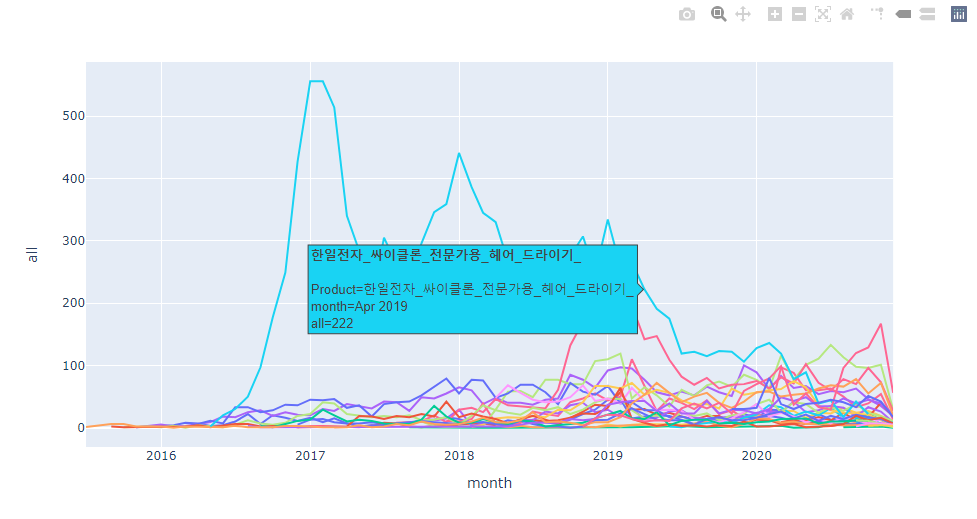

In [43]:
fig = px.line(Da2, x="month", y="all", color="Product",
              color_discrete_sequence=px.colors.qualitative.Set2_r, #line_group="country",
               hover_name="Product")
fig.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1),
    plot_bgcolor='white')

fig.update_layout(annotations = [dict(xref='paper', yref='paper', x=0.0, y=1.05,
                              xanchor='left', yanchor='bottom',
                              text='Coupang Hair',
                              font=dict(family='Arial',
                                        size=20,
                                        color='rgb(37,37,37)'),
                              showarrow=False)])
fig.update_yaxes(showline=True, linewidth=2, gridcolor='rgb(204, 204, 204)')

fig.show()

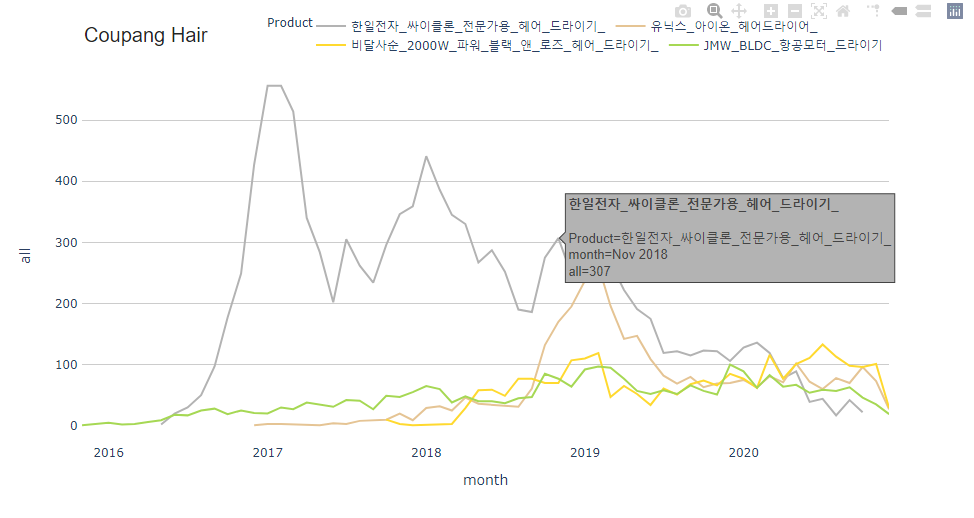

In [44]:
fig = px.bar(Da1, x="month", y="all", color="Product")
fig.update_layout(showlegend=False)
fig.show()

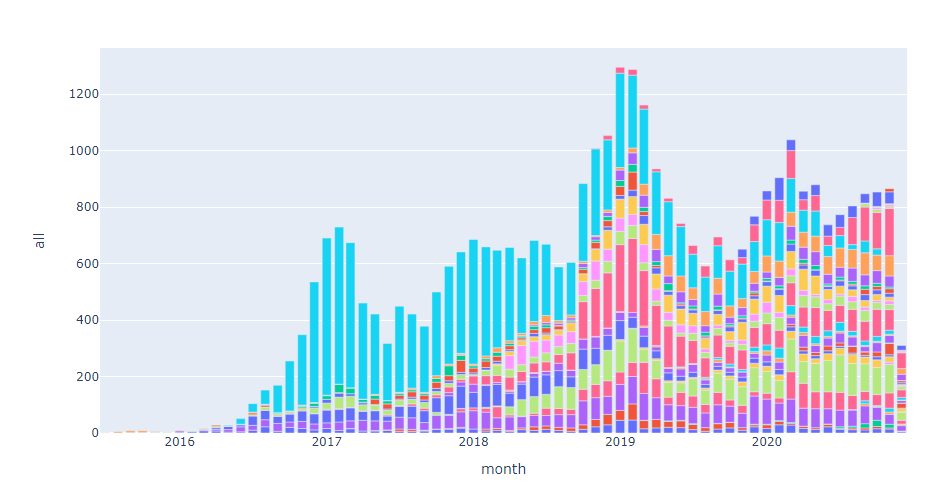

In [45]:
Da11

,index,month,pos,neg,neu,all,Product
0,0,2015-11,1.0,0.0,0.0,1.0,CKI_가정용_접이식_헤어_드라이어_
1,1,2015-11,1.0,0.0,0.0,1.0,CKI_가정용_접이식_헤어_드라이어_
2,2,2015-11,1.0,0.0,0.0,1.0,CKI_가정용_접이식_헤어_드라이어_
3,3,2015-11,1.0,0.0,0.0,1.0,CKI_가정용_접이식_헤어_드라이어_
4,4,2016-01,3.0,0.0,0.0,3.0,CKI_가정용_접이식_헤어_드라이어_
...,...,...,...,...,...,...,...
31995,995,2015-12,0.0,0.0,0.0,0.0,홈플래닛_헤어드라이어_
31996,996,2015-09,0.0,0.0,0.0,0.0,홈플래닛_헤어드라이어_
31997,997,2015-09,0.0,0.0,0.0,0.0,홈플래닛_헤어드라이어_
31998,998,2015-07,0.0,0.0,0.0,0.0,홈플래닛_헤어드라이어_


In [46]:
Da11["pos_2"] = Da11["pos"].map(lambda x: min(x,200))

In [47]:
Da11 = Da11.sort_values(by="month")

In [48]:
fig = px.scatter(Da11, x="pos_2", y="neg", animation_frame="month",animation_group="Product",
           size="all", color="Product", hover_name="Product"
            ,size_max=55, range_x=[-40,210], range_y=[-5,30], title="Coupang Product Matrix")


In [49]:
fig.update_layout(showlegend=False,plot_bgcolor="white")

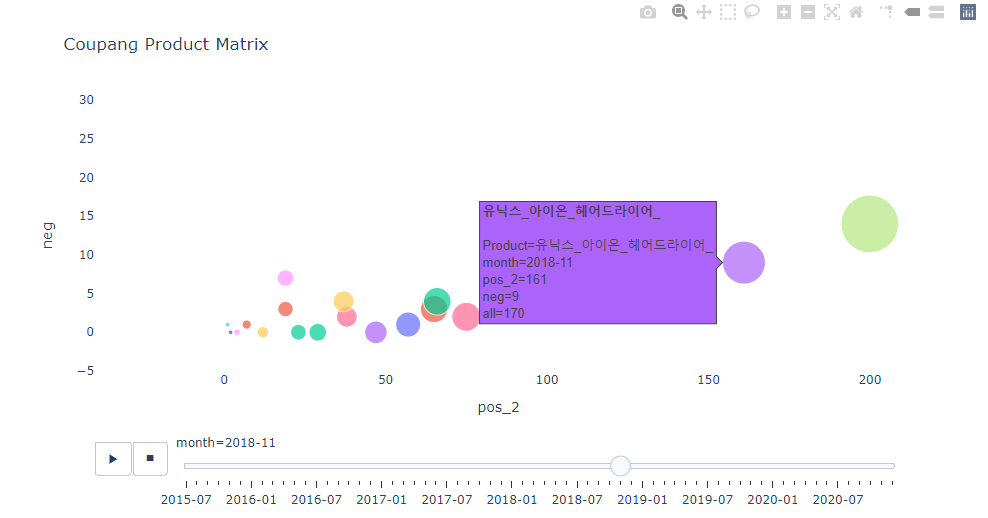

In [50]:
Da22["Product"].value_counts()

비달사순_2000W_파워_블랙_앤_로즈_헤어_드라이기_    202
JMW_BLDC_항공모터_드라이기                202
유닉스_아이온_헤어드라이어_                   202
한일전자_싸이클론_전문가용_헤어_드라이기_           202
Name: Product, dtype: int64

In [53]:
# 부정률 하나 상품 test
target_ = "한일전자_싸이클론_전문가용_헤어_드라이기_"
pro_1 = Da1[Da1["Product"] == target_ ]
pro_1["per_pos"] = pro_1["pos"]/pro_1["all"]
pro_1["per_neg"] = (pro_1["neg"]+pro_1["neu"])/pro_1["all"]
pro_1 = pro_1.reset_index(drop=True)
mon = []
tag = []
score = []
for i in range(len(pro_1)):
    mon.append(pro_1.loc[i,"month"])
    tag.append("pro")
    score.append(pro_1.loc[i,"per_pos"])
    
    mon.append(pro_1.loc[i,"month"])
    tag.append("neg")
    score.append(pro_1.loc[i,"per_neg"])
pro_2 = pd.DataFrame([mon,tag,score]).T.rename(columns={0:"month",1:"tag",2:"score"})
fig = px.bar(pro_2, x="month", y=score,color="tag",  title=target_,range_y=[0.7,1])
fig.show()

C:\Users\Samsung\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Samsung\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



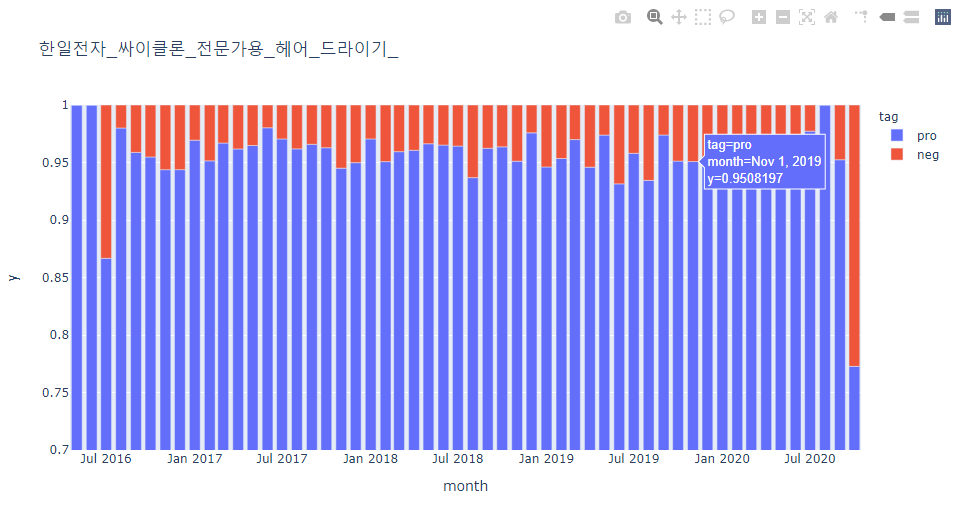

In [52]:
# 부정률 하나 상품 test
target_ = "유닉스_아이온_헤어드라이어_"
pro_1 = Da1[Da1["Product"] == target_ ]
pro_1["per_pos"] = pro_1["pos"]/pro_1["all"]
pro_1["per_neg"] = (pro_1["neg"]+pro_1["neu"])/pro_1["all"]
pro_1 = pro_1.reset_index(drop=True)
mon = []
tag = []
score = []
for i in range(len(pro_1)):
    mon.append(pro_1.loc[i,"month"])
    tag.append("pro")
    score.append(pro_1.loc[i,"per_pos"])
    
    mon.append(pro_1.loc[i,"month"])
    tag.append("neg")
    score.append(pro_1.loc[i,"per_neg"])
pro_2 = pd.DataFrame([mon,tag,score]).T.rename(columns={0:"month",1:"tag",2:"score"})
fig = px.bar(pro_2, x="month", y=score,color="tag",  title=target_,range_y=[0.7,1])
fig.show()

C:\Users\Samsung\anaconda3\lib\site-packages\ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

C:\Users\Samsung\anaconda3\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



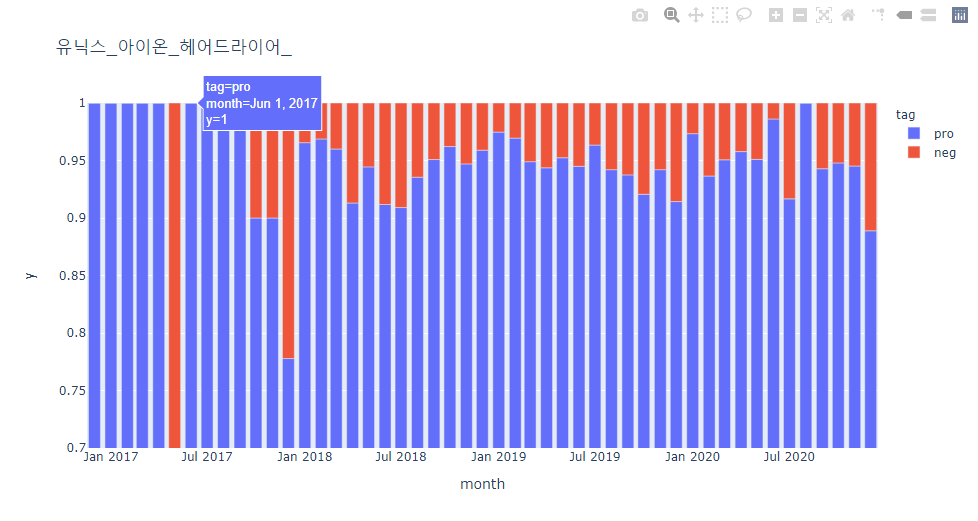